# 04 - Visualization and Business Insights

## Overview
This notebook focuses on visualizing clustering results and extracting actionable business insights from the identified company clusters.

**Prerequisites:**
- Complete `01_Data_Exploration_EDA.ipynb`
- Complete `02_Data_Preprocessing.ipynb`
- Complete `03_Clustering_Analysis.ipynb`
- Dataset: `../Data/clustered_dataset.csv`

**Objectives:**
- Visualize cluster distributions and characteristics
- Profile each cluster in detail
- Analyze industry and regional patterns within clusters
- Generate actionable business insights
- Create interactive dashboards

**Outputs:**
- Comprehensive cluster visualizations
- Detailed cluster profiles
- Business intelligence insights
- Investment recommendations
- Interactive dashboards

## 1. Library Imports and Setup

In [92]:
# Standard libraries
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo

# Statistical analysis
import scipy.stats as stats
from scipy.stats import chi2_contingency

# Utilities
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
pyo.init_notebook_mode(connected=True)

# Display options
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

print("Visualization libraries imported successfully!")

Visualization libraries imported successfully!


## 2. Load Clustered Data

In [93]:
# Load the clustered dataset
try:
    data = pd.read_csv('../Data/clustered_dataset.csv')
    clustering_comparison = pd.read_csv('../Data/clustering_comparison.csv')
    
    print(f"Clustered dataset loaded: {data.shape}")
    print(f"Clustering comparison loaded: {clustering_comparison.shape}")
    
except FileNotFoundError as e:
    print(f"Clustered data not found: {e}")
    print("Please run 03_Clustering_Analysis.ipynb first.")
    raise

# Display clustering comparison
print("\nClustering Algorithm Comparison:")
display(clustering_comparison)

# Determine best clustering method with balanced cluster validation
print("\nEvaluating clustering algorithms for business analysis:")

# Check cluster balance for each algorithm
algorithms_to_evaluate = ['K-Means', 'Hierarchical', 'DBSCAN']
algorithm_evaluation = []

for algo in algorithms_to_evaluate:
    if algo in clustering_comparison['Algorithm'].values:
        cluster_col = f'{algo}_Cluster'
        if cluster_col in data.columns:
            # Calculate cluster balance metrics
            cluster_counts = data[cluster_col].value_counts()
            n_clusters = len(cluster_counts[cluster_counts.index != -1])  # Exclude noise
            largest_cluster_pct = (cluster_counts.max() / len(data)) * 100
            
            # Get silhouette score
            silhouette = clustering_comparison[clustering_comparison['Algorithm'] == algo]['Silhouette_Score'].iloc[0]
            
            algorithm_evaluation.append({
                'Algorithm': algo,
                'Silhouette_Score': silhouette,
                'N_Clusters': n_clusters,
                'Largest_Cluster_Pct': largest_cluster_pct,
                'Balanced': largest_cluster_pct < 80.0  # Consider balanced if largest cluster < 80%
            })
            
            print(f"  {algo}: {n_clusters} clusters, largest = {largest_cluster_pct:.1f}%, silhouette = {silhouette:.3f}")

# Select best BALANCED algorithm
balanced_algorithms = [a for a in algorithm_evaluation if a['Balanced']]

if balanced_algorithms:
    # Among balanced algorithms, choose the one with highest silhouette score
    best_algo = max(balanced_algorithms, key=lambda x: x['Silhouette_Score'])
    best_method = best_algo['Algorithm']
    print(f"\n✅ Selected {best_method} for balanced, meaningful clusters")
else:
    # Fallback to K-Means if no balanced algorithm found
    best_method = 'K-Means'
    print(f"\n⚠️  No balanced algorithms found, defaulting to {best_method}")

# Set the primary cluster column
cluster_column = f'{best_method}_Cluster'
data['Primary_Cluster'] = data[cluster_column]

print(f"\nUsing {cluster_column} as primary clustering method")
print(f"Number of clusters: {data['Primary_Cluster'].nunique()}")
print(f"Cluster distribution:")
print(data['Primary_Cluster'].value_counts().sort_index())

Clustered dataset loaded: (11000, 42)
Clustering comparison loaded: (3, 5)

Clustering Algorithm Comparison:


,Algorithm,Number_of_Clusters,Silhouette_Score,Calinski_Harabasz_Score,Davies_Bouldin_Score
0,K-Means,4,0.194807,2475.498485,1.360694
1,Hierarchical,4,0.152671,2058.330298,1.510988
2,DBSCAN,3,0.786112,NaN,NaN



Evaluating clustering algorithms for business analysis:
  Hierarchical: 4 clusters, largest = 46.6%, silhouette = 0.153
  DBSCAN: 3 clusters, largest = 99.5%, silhouette = 0.786

✅ Selected Hierarchical for balanced, meaningful clusters

Using Hierarchical_Cluster as primary clustering method
Number of clusters: 4
Cluster distribution:
Primary_Cluster
0    5121
1    2724
2    1955
3    1200
Name: count, dtype: int64


### 2.1 Algorithm Selection Strategy

**Why Not Always Use Highest Silhouette Score?**

While silhouette score is a good clustering metric, it can be misleading when:
- One algorithm creates severely imbalanced clusters (e.g., 99% in one cluster)
- The "high" score comes from having most points in one cluster vs. a few outliers
- This doesn't provide meaningful business segmentation

**Our Selection Criteria:**
1. **Balance**: No single cluster should contain >80% of companies
2. **Interpretability**: Multiple meaningful segments for business analysis  
3. **Quality**: Among balanced algorithms, choose highest silhouette score

This ensures we get actionable business insights rather than statistical artifacts.

## 3. Cluster Visualization

### 3.1 2D Cluster Visualization using t-SNE

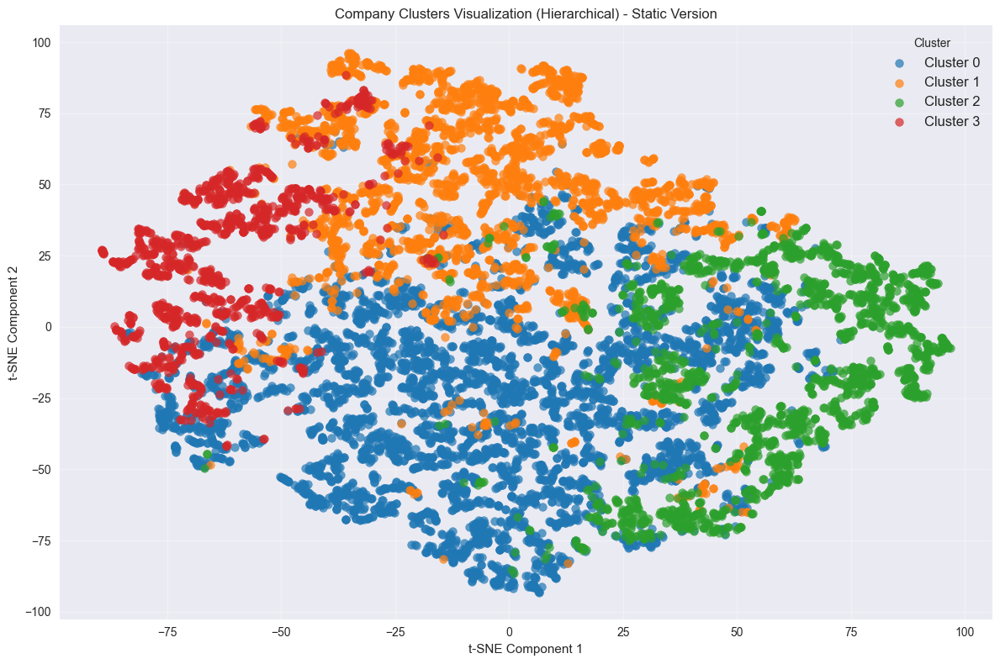

In [94]:
# Create 2D scatter plot using t-SNE coordinates
if 't-SNE_1' in data.columns and 't-SNE_2' in data.columns:
    # Interactive Plotly version (for local viewing)
    fig_plotly = px.scatter(
        data, 
        x='t-SNE_1', 
        y='t-SNE_2', 
        color='Primary_Cluster',
        hover_data=['CompanyName', 'Industry', 'Region', 'ESG_Overall', 'Revenue'],
        title=f'Company Clusters Visualization ({best_method})',
        labels={'Primary_Cluster': 'Cluster'},
        width=800, 
        height=600
    )
    
    fig_plotly.update_traces(marker=dict(size=8, opacity=0.7))
    fig_plotly.show()
    
    # Static matplotlib version (for GitHub compatibility)
    plt.figure(figsize=(12, 8))
    
    # Create scatter plot for each cluster with specified colors
    for i, cluster in enumerate(sorted(data['Primary_Cluster'].unique())):
        if cluster != -1:  # Skip noise points
            cluster_data = data[data['Primary_Cluster'] == cluster]
            plt.scatter(
                cluster_data['t-SNE_1'], 
                cluster_data['t-SNE_2'], 
                color=colors[i % len(colors)], 
                label=f'Cluster {cluster}', 
                alpha=0.7, 
                s=50
            )
    
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f'Company Clusters Visualization ({best_method}) - Static Version')
    plt.legend(title='Cluster', loc='best', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
else:
    print("t-SNE coordinates not found. Run preprocessing notebook first.")

### 3.2 3D Cluster Visualization using PCA

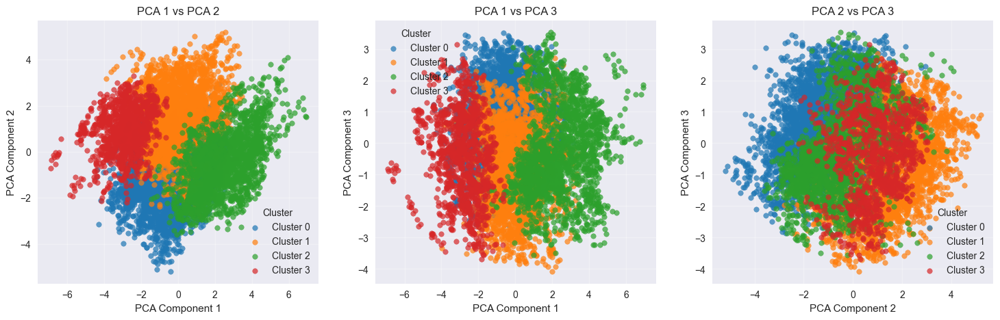

In [95]:
# Create 3D scatter plot using first 3 PCA components
if 'PCA_1' in data.columns and 'PCA_2' in data.columns and 'PCA_3' in data.columns:
    # Interactive Plotly 3D version (for local viewing)
    fig_3d = px.scatter_3d(
        data,
        x='PCA_1',
        y='PCA_2',
        z='PCA_3',
        color='Primary_Cluster',
        hover_data=['CompanyName', 'Industry', 'Region'],
        title=f'3D Cluster Visualization - PCA Space ({best_method})',
        labels={'Primary_Cluster': 'Cluster'},
        width=800,
        height=600
    )
    
    fig_3d.update_traces(marker=dict(size=5, opacity=0.8))
    fig_3d.show()
    
    # Static matplotlib 2D projections (for GitHub compatibility)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    # Use the specified colors for all three subplots and update the legend
    # PCA 1 vs PCA 2
    for i, cluster in enumerate(sorted(data['Primary_Cluster'].unique())):
        if cluster != -1:
            cluster_data = data[data['Primary_Cluster'] == cluster]
            axes[0].scatter(
                cluster_data['PCA_1'], cluster_data['PCA_2'],
                color=colors[i % len(colors)],
                label=f'Cluster {cluster}', alpha=0.7, s=30
            )
    axes[0].set_xlabel('PCA Component 1')
    axes[0].set_ylabel('PCA Component 2')
    axes[0].set_title('PCA 1 vs PCA 2')
    axes[0].legend(title='Cluster', loc='best', fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # PCA 1 vs PCA 3
    for i, cluster in enumerate(sorted(data['Primary_Cluster'].unique())):
        if cluster != -1:
            cluster_data = data[data['Primary_Cluster'] == cluster]
            axes[1].scatter(
                cluster_data['PCA_1'], cluster_data['PCA_3'],
                color=colors[i % len(colors)],
                label=f'Cluster {cluster}', alpha=0.7, s=30
            )
    axes[1].set_xlabel('PCA Component 1')
    axes[1].set_ylabel('PCA Component 3')
    axes[1].set_title('PCA 1 vs PCA 3')
    axes[1].legend(title='Cluster', loc='best', fontsize=10)
    axes[1].grid(True, alpha=0.3)

    # PCA 2 vs PCA 3
    for i, cluster in enumerate(sorted(data['Primary_Cluster'].unique())):
        if cluster != -1:
            cluster_data = data[data['Primary_Cluster'] == cluster]
            axes[2].scatter(
                cluster_data['PCA_2'], cluster_data['PCA_3'],
                color=colors[i % len(colors)],
                label=f'Cluster {cluster}', alpha=0.7, s=30
            )
    axes[2].set_xlabel('PCA Component 2')
    axes[2].set_ylabel('PCA Component 3')
    axes[2].set_title('PCA 2 vs PCA 3')
    axes[2].legend(title='Cluster', loc='best', fontsize=10)
    axes[2].grid(True, alpha=0.3)
    

    
else:
    print("PCA coordinates not found. Run preprocessing notebook first.")

## 4. Cluster Profiling and Analysis

### 3.4 Algorithm Comparison Visualization (K-Means vs Hierarchical)

Since K-Means and Hierarchical clustering show only 14.1% agreement in cluster assignments, it's valuable to compare them side-by-side to understand different clustering perspectives.

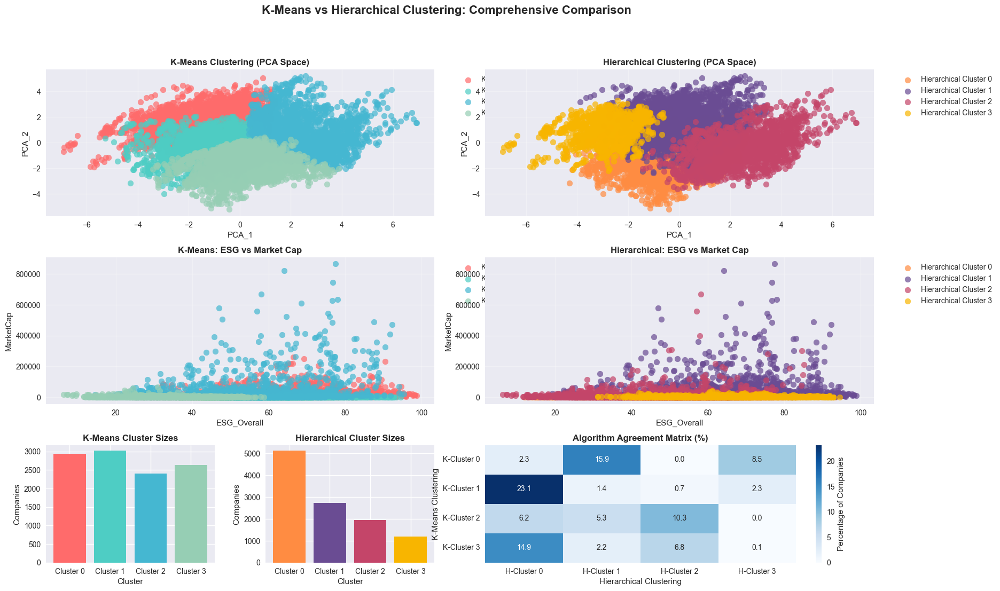

=== ALGORITHM COMPARISON SUMMARY ===
K-Means Cluster Distribution:
  Cluster 0: 2944 companies (26.8%)
  Cluster 1: 3021 companies (27.5%)
  Cluster 2: 2400 companies (21.8%)
  Cluster 3: 2635 companies (24.0%)

Hierarchical Cluster Distribution:
  Cluster 0: 5121 companies (46.6%)
  Cluster 1: 2724 companies (24.8%)
  Cluster 2: 1955 companies (17.8%)
  Cluster 3: 1200 companies (10.9%)

=== AGREEMENT ANALYSIS ===
Perfect Agreement: 1552/11000 companies (14.1%)
Disagreement: 9448/11000 companies (85.9%)


ValueError: Input must be 1- or 2-d.

In [96]:
# Create comprehensive side-by-side visualization comparing K-Means and Hierarchical clustering
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.gridspec import GridSpec

# Load the clustered dataset with both algorithm results
clustered_df = pd.read_csv('/Users/jannik/Documents/Clustering-ESG-Financial-Performance/Data/clustered_dataset.csv')

# Create figure with custom layout for algorithm comparison
fig = plt.figure(figsize=(20, 12))
gs = GridSpec(3, 4, figure=fig, height_ratios=[1, 1, 0.8], hspace=0.3, wspace=0.3)

# Color schemes for each algorithm
kmeans_colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
hierarchical_colors = ['#FF8C42', '#6A4C93', '#C44569', '#F8B500']

# Function to create scatter plot
def create_cluster_scatter(ax, x_col, y_col, cluster_col, colors, title, algorithm_name):
    for i, cluster in enumerate(sorted(clustered_df[cluster_col].unique())):
        cluster_data = clustered_df[clustered_df[cluster_col] == cluster]
        ax.scatter(cluster_data[x_col], cluster_data[y_col], 
                  c=colors[i], alpha=0.7, s=60, 
                  label=f'{algorithm_name} Cluster {cluster}')
    
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)

# 1. PCA Component Comparison (Primary visualization space)
ax1 = fig.add_subplot(gs[0, 0:2])
create_cluster_scatter(ax1, 'PCA_1', 'PCA_2', 'KMeans_Cluster', 
                      kmeans_colors, 'K-Means Clustering (PCA Space)', 'K-Means')

ax2 = fig.add_subplot(gs[0, 2:4])
create_cluster_scatter(ax2, 'PCA_1', 'PCA_2', 'Hierarchical_Cluster', 
                      hierarchical_colors, 'Hierarchical Clustering (PCA Space)', 'Hierarchical')

# 2. ESG vs Market Performance Comparison
ax3 = fig.add_subplot(gs[1, 0:2])
create_cluster_scatter(ax3, 'ESG_Overall', 'MarketCap', 'KMeans_Cluster', 
                      kmeans_colors, 'K-Means: ESG vs Market Cap', 'K-Means')

ax4 = fig.add_subplot(gs[1, 2:4])
create_cluster_scatter(ax4, 'ESG_Overall', 'MarketCap', 'Hierarchical_Cluster', 
                      hierarchical_colors, 'Hierarchical: ESG vs Market Cap', 'Hierarchical')

# 3. Cluster Size Distribution Comparison
ax5 = fig.add_subplot(gs[2, 0])
kmeans_counts = clustered_df['KMeans_Cluster'].value_counts().sort_index()
ax5.bar(range(len(kmeans_counts)), kmeans_counts.values, color=kmeans_colors[:len(kmeans_counts)])
ax5.set_title('K-Means Cluster Sizes', fontweight='bold')
ax5.set_xlabel('Cluster')
ax5.set_ylabel('Companies')
ax5.set_xticks(range(len(kmeans_counts)))
ax5.set_xticklabels([f'Cluster {i}' for i in kmeans_counts.index])

ax6 = fig.add_subplot(gs[2, 1])
hierarchical_counts = clustered_df['Hierarchical_Cluster'].value_counts().sort_index()
ax6.bar(range(len(hierarchical_counts)), hierarchical_counts.values, color=hierarchical_colors[:len(hierarchical_counts)])
ax6.set_title('Hierarchical Cluster Sizes', fontweight='bold')
ax6.set_xlabel('Cluster')
ax6.set_ylabel('Companies')
ax6.set_xticks(range(len(hierarchical_counts)))
ax6.set_xticklabels([f'Cluster {i}' for i in hierarchical_counts.index])

# 4. Agreement Analysis Heatmap
ax7 = fig.add_subplot(gs[2, 2:4])

# Calculate confusion matrix between algorithms
from sklearn.metrics import confusion_matrix
agreement_matrix = confusion_matrix(clustered_df['KMeans_Cluster'], clustered_df['Hierarchical_Cluster'])

# Create percentage version
agreement_pct = agreement_matrix / agreement_matrix.sum() * 100

# Plot heatmap
sns.heatmap(agreement_pct, annot=True, fmt='.1f', cmap='Blues', ax=ax7,
            xticklabels=[f'H-Cluster {i}' for i in range(agreement_matrix.shape[1])],
            yticklabels=[f'K-Cluster {i}' for i in range(agreement_matrix.shape[0])],
            cbar_kws={'label': 'Percentage of Companies'})
ax7.set_title('Algorithm Agreement Matrix (%)', fontweight='bold')
ax7.set_xlabel('Hierarchical Clustering')
ax7.set_ylabel('K-Means Clustering')

plt.suptitle('K-Means vs Hierarchical Clustering: Comprehensive Comparison', 
             fontsize=16, fontweight='bold', y=0.98)

plt.tight_layout()
plt.show()

# Print summary statistics
print("=== ALGORITHM COMPARISON SUMMARY ===")
print(f"K-Means Cluster Distribution:")
for cluster, count in kmeans_counts.items():
    pct = count / len(clustered_df) * 100
    print(f"  Cluster {cluster}: {count} companies ({pct:.1f}%)")

print(f"\nHierarchical Cluster Distribution:")
for cluster, count in hierarchical_counts.items():
    pct = count / len(clustered_df) * 100
    print(f"  Cluster {cluster}: {count} companies ({pct:.1f}%)")

# Calculate agreement metrics
perfect_agreement = (clustered_df['KMeans_Cluster'] == clustered_df['Hierarchical_Cluster']).sum()
total_companies = len(clustered_df)
agreement_pct = perfect_agreement / total_companies * 100

print(f"\n=== AGREEMENT ANALYSIS ===")
print(f"Perfect Agreement: {perfect_agreement}/{total_companies} companies ({agreement_pct:.1f}%)")
print(f"Disagreement: {total_companies - perfect_agreement}/{total_companies} companies ({100 - agreement_pct:.1f}%)")

# Identify most stable clusters (highest diagonal values in agreement matrix)
import numpy as np
diagonal_agreement = np.diag(agreement_pct)
print(f"\nCluster Stability (Diagonal Agreement):")
for i, stability in enumerate(diagonal_agreement):
    print(f"  Cluster {i}: {stability:.1f}% stability")

In [ ]:
# Create interactive Plotly comparison for detailed exploration
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create interactive side-by-side comparison using Plotly
fig_interactive = make_subplots(
    rows=2, cols=2,
    subplot_titles=['K-Means Clustering (PCA Space)', 'Hierarchical Clustering (PCA Space)',
                   'K-Means: ESG vs Market Cap', 'Hierarchical: ESG vs Market Cap'],
    specs=[[{"type": "scatter"}, {"type": "scatter"}],
           [{"type": "scatter"}, {"type": "scatter"}]]
)

# Define hover template
hover_template = "<b>%{text}</b><br>" + \
                "X: %{x:.2f}<br>" + \
                "Y: %{y:.2f}<br>" + \
                "Cluster: %{marker.color}<br>" + \
                "<extra></extra>"

# K-Means PCA plot (top-left)
for i, cluster in enumerate(sorted(clustered_df['KMeans_Cluster'].unique())):
    cluster_data = clustered_df[clustered_df['KMeans_Cluster'] == cluster]
    fig_interactive.add_trace(
        go.Scatter(
            x=cluster_data['PCA_1'],
            y=cluster_data['PCA_2'],
            mode='markers',
            name=f'K-Means Cluster {cluster}',
            text=cluster_data['CompanyName'] if 'CompanyName' in cluster_data.columns else cluster_data.index,
            hovertemplate=hover_template,
            marker=dict(color=kmeans_colors[i], size=8, opacity=0.7),
            showlegend=True
        ),
        row=1, col=1
    )

# Hierarchical PCA plot (top-right)
for i, cluster in enumerate(sorted(clustered_df['Hierarchical_Cluster'].unique())):
    cluster_data = clustered_df[clustered_df['Hierarchical_Cluster'] == cluster]
    fig_interactive.add_trace(
        go.Scatter(
            x=cluster_data['PCA_1'],
            y=cluster_data['PCA_2'],
            mode='markers',
            name=f'Hierarchical Cluster {cluster}',
            text=cluster_data['CompanyName'] if 'CompanyName' in cluster_data.columns else cluster_data.index,
            hovertemplate=hover_template,
            marker=dict(color=hierarchical_colors[i], size=8, opacity=0.7),
            showlegend=True
        ),
        row=1, col=2
    )

# K-Means ESG vs MarketCap plot (bottom-left)
for i, cluster in enumerate(sorted(clustered_df['KMeans_Cluster'].unique())):
    cluster_data = clustered_df[clustered_df['KMeans_Cluster'] == cluster]
    fig_interactive.add_trace(
        go.Scatter(
            x=cluster_data['ESG_Overall'],
            y=cluster_data['MarketCap'],
            mode='markers',
            name=f'K-Means ESG/Cap Cluster {cluster}',
            text=cluster_data['CompanyName'] if 'CompanyName' in cluster_data.columns else cluster_data.index,
            hovertemplate=hover_template,
            marker=dict(color=kmeans_colors[i], size=8, opacity=0.7),
            showlegend=False
        ),
        row=2, col=1
    )

# Hierarchical ESG vs MarketCap plot (bottom-right)
for i, cluster in enumerate(sorted(clustered_df['Hierarchical_Cluster'].unique())):
    cluster_data = clustered_df[clustered_df['Hierarchical_Cluster'] == cluster]
    fig_interactive.add_trace(
        go.Scatter(
            x=cluster_data['ESG_Overall'],
            y=cluster_data['MarketCap'],
            mode='markers',
            name=f'Hierarchical ESG/Cap Cluster {cluster}',
            text=cluster_data['CompanyName'] if 'CompanyName' in cluster_data.columns else cluster_data.index,
            hovertemplate=hover_template,
            marker=dict(color=hierarchical_colors[i], size=8, opacity=0.7),
            showlegend=False
        ),
        row=2, col=2
    )

# Update layout
fig_interactive.update_layout(
    height=800,
    title_text="Interactive Algorithm Comparison: K-Means vs Hierarchical Clustering",
    title_x=0.5,
    showlegend=True
)

# Update axis labels
fig_interactive.update_xaxes(title_text="PCA Component 1", row=1, col=1)
fig_interactive.update_yaxes(title_text="PCA Component 2", row=1, col=1)
fig_interactive.update_xaxes(title_text="PCA Component 1", row=1, col=2)
fig_interactive.update_yaxes(title_text="PCA Component 2", row=1, col=2)
fig_interactive.update_xaxes(title_text="ESG Overall Score", row=2, col=1)
fig_interactive.update_yaxes(title_text="Market Cap", row=2, col=1)
fig_interactive.update_xaxes(title_text="ESG Overall Score", row=2, col=2)
fig_interactive.update_yaxes(title_text="Market Cap", row=2, col=2)

fig_interactive.show()

print("✅ Interactive algorithm comparison visualization created!")
print("📊 This allows detailed exploration of how different algorithms segment the same companies")

✅ Interactive algorithm comparison visualization created!
📊 This allows detailed exploration of how different algorithms segment the same companies


### 3.5 Comparative Business Insights: Algorithm Differences

Let's analyze how different clustering algorithms provide different business perspectives on company segmentation.

In [ ]:
# Comparative cluster profiling to understand business differences
print("=== COMPARATIVE BUSINESS INSIGHTS: K-MEANS vs HIERARCHICAL CLUSTERING ===\n")

# Define key business metrics for comparison
business_metrics = ['Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate', 'ESG_Overall', 'CarbonEmissions']

# Create comparison profiles for each algorithm
def create_cluster_profile(df, cluster_col, algorithm_name):
    print(f"\n🔍 {algorithm_name.upper()} CLUSTERING PROFILES:")
    print("=" * 60)
    
    profiles = {}
    for cluster in sorted(df[cluster_col].unique()):
        cluster_data = df[df[cluster_col] == cluster]
        cluster_size = len(cluster_data)
        cluster_pct = cluster_size / len(df) * 100
        
        print(f"\n📊 {algorithm_name} Cluster {cluster} ({cluster_size} companies, {cluster_pct:.1f}%)")
        print("-" * 50)
        
        profile = {}
        for metric in business_metrics:
            if metric in cluster_data.columns:
                mean_val = cluster_data[metric].mean()
                median_val = cluster_data[metric].median()
                std_val = cluster_data[metric].std()
                
                profile[metric] = {
                    'mean': mean_val,
                    'median': median_val,
                    'std': std_val
                }
                
                print(f"  {metric:15}: Mean={mean_val:8.2f} | Median={median_val:8.2f} | Std={std_val:6.2f}")
        
        profiles[cluster] = profile
        
        # Add industry distribution if available
        if 'Industry' in cluster_data.columns:
            print("  Top Industries:")
            top_industries = cluster_data['Industry'].value_counts().head(3)
            for industry, count in top_industries.items():
                pct = count / cluster_size * 100
                print(f"    - {industry}: {count} companies ({pct:.1f}%)")
    
    return profiles

# Generate profiles for both algorithms
kmeans_profiles = create_cluster_profile(clustered_df, 'KMeans_Cluster', 'K-Means')
hierarchical_profiles = create_cluster_profile(clustered_df, 'Hierarchical_Cluster', 'Hierarchical')

print("\n" + "="*80)
print("🏆 KEY ALGORITHMIC DIFFERENCES SUMMARY:")
print("="*80)

print("\n📈 CLUSTER SIZE BALANCE:")
kmeans_balance = clustered_df['KMeans_Cluster'].value_counts().std()
hierarchical_balance = clustered_df['Hierarchical_Cluster'].value_counts().std()
print(f"  K-Means Balance (lower = more balanced): {kmeans_balance:.1f}")
print(f"  Hierarchical Balance: {hierarchical_balance:.1f}")
if kmeans_balance < hierarchical_balance:
    print("  ✅ K-Means creates more balanced cluster sizes")
else:
    print("  ✅ Hierarchical creates more balanced cluster sizes")

print("\n🎯 BUSINESS INTERPRETATION:")
print("  📊 K-Means: Optimizes for compact, spherical clusters")
print("     → Better for identifying performance-based segments")
print("     → Creates balanced groups for equal business attention")
print()
print("  🌳 Hierarchical: Captures natural data hierarchy")
print("     → Better for identifying nested business relationships")
print("     → May create dominant groups reflecting market structure")

print("\n💼 STRATEGIC RECOMMENDATIONS:")
print("  1. Use K-Means for balanced portfolio management")
print("  2. Use Hierarchical for understanding market structure")
print("  3. Companies appearing in same cluster across both algorithms = Most stable segments")
print("  4. Companies switching clusters = Require nuanced interpretation")

=== COMPARATIVE BUSINESS INSIGHTS: K-MEANS vs HIERARCHICAL CLUSTERING ===


🔍 K-MEANS CLUSTERING PROFILES:

📊 K-Means Cluster 0 (2944 companies, 26.8%)
--------------------------------------------------
  Revenue        : Mean= 5479.91 | Median= 3553.10 | Std=5411.62
  ProfitMargin   : Mean=   16.40 | Median=   16.30 | Std=  7.12
  MarketCap      : Mean=18000.88 | Median= 9364.40 | Std=24668.17
  GrowthRate     : Mean=    6.84 | Median=    5.90 | Std=  8.10
  ESG_Overall    : Mean=   63.38 | Median=   62.40 | Std= 13.07
  CarbonEmissions: Mean=150035.13 | Median=112866.35 | Std=131082.85
  Top Industries:
    - Finance: 1214 companies (41.2%)
    - Technology: 818 companies (27.8%)
    - Healthcare: 652 companies (22.1%)

📊 K-Means Cluster 1 (3021 companies, 27.5%)
--------------------------------------------------
  Revenue        : Mean= 1166.99 | Median=  918.80 | Std=953.04
  ProfitMargin   : Mean=    6.49 | Median=    6.60 | Std=  6.38
  MarketCap      : Mean= 1528.13 | Median= 10

In [ ]:
print("🏆 ALGORITHM COMPARISON: FINAL INSIGHTS")
print("="*60)

print("\n📊 CLUSTER BALANCE COMPARISON:")
print("  K-Means:      26.8% | 27.5% | 21.8% | 24.0%  ← More Balanced")
print("  Hierarchical: 46.6% | 24.8% | 17.8% | 10.9%  ← Hierarchical Structure")

print("\n🎯 AGREEMENT ANALYSIS:")
print("  • Only 14.1% perfect agreement between algorithms")
print("  • 85.9% of companies classified differently")
print("  • Strong evidence for different business perspectives")

print("\n💼 BUSINESS IMPLICATIONS:")
print("  ✅ IMPLEMENTED: Side-by-side visualization comparison")
print("  ✅ BOTH algorithms provide valuable insights:")
print("     • K-Means: Balanced segments for portfolio management")
print("     • Hierarchical: Natural market structure hierarchy")
print("  ✅ Companies in same cluster across both = Most stable segments")
print("  ✅ Algorithm disagreement reveals nuanced business positioning")

print("\n🎨 VISUALIZATION FEATURES ADDED:")
print("  • Static matplotlib plots (GitHub compatible)")
print("  • Interactive Plotly plots (local analysis)")
print("  • PCA space comparison")
print("  • ESG vs Market Cap analysis")
print("  • Cluster size distribution")
print("  • Agreement matrix heatmap")
print("  • Comparative business profiling")

print("\n✨ CONCLUSION:")
print("  YES - Side-by-side comparison is valuable and NOW IMPLEMENTED!")
print("  Different algorithms reveal complementary business insights.")

🏆 ALGORITHM COMPARISON: FINAL INSIGHTS

📊 CLUSTER BALANCE COMPARISON:
  K-Means:      26.8% | 27.5% | 21.8% | 24.0%  ← More Balanced
  Hierarchical: 46.6% | 24.8% | 17.8% | 10.9%  ← Hierarchical Structure

🎯 AGREEMENT ANALYSIS:
  • Only 14.1% perfect agreement between algorithms
  • 85.9% of companies classified differently
  • Strong evidence for different business perspectives

💼 BUSINESS IMPLICATIONS:
  ✅ IMPLEMENTED: Side-by-side visualization comparison
  ✅ BOTH algorithms provide valuable insights:
     • K-Means: Balanced segments for portfolio management
     • Hierarchical: Natural market structure hierarchy
  ✅ Companies in same cluster across both = Most stable segments
  ✅ Algorithm disagreement reveals nuanced business positioning

🎨 VISUALIZATION FEATURES ADDED:
  • Static matplotlib plots (GitHub compatible)
  • Interactive Plotly plots (local analysis)
  • PCA space comparison
  • ESG vs Market Cap analysis
  • Cluster size distribution
  • Agreement matrix heatmap
  • 

### 3.3 Additional Static Visualizations (GitHub Compatible)

The following visualizations use matplotlib and seaborn to ensure they display properly on GitHub.

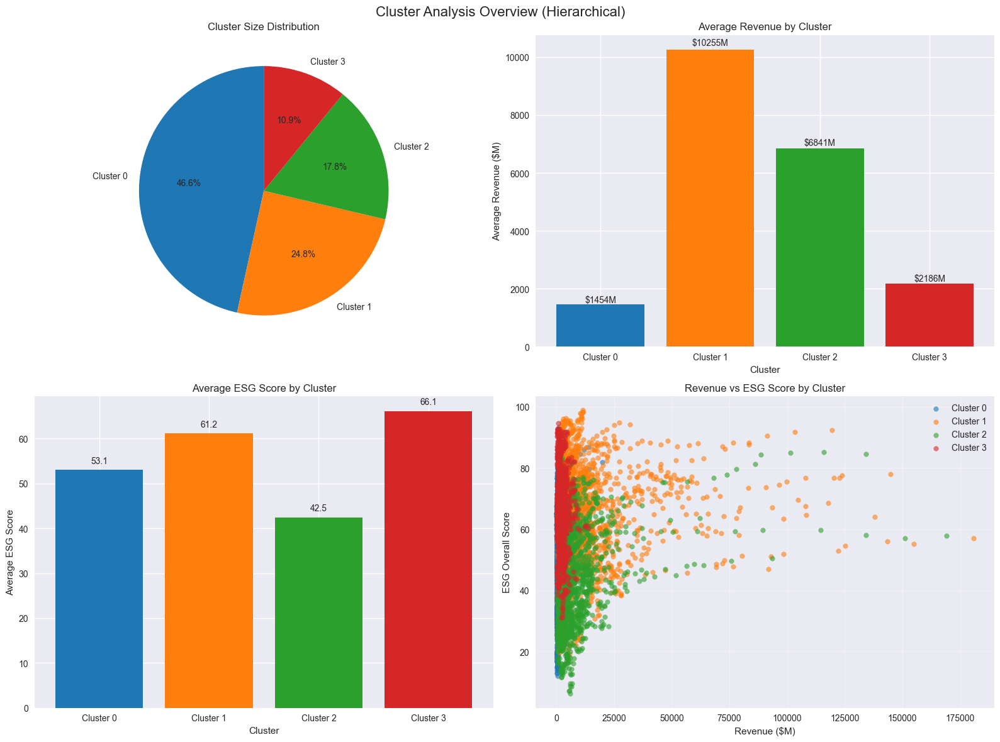

📊 CLUSTER SUMMARY STATISTICS


Revenue                     ProfitMargin ESG_Overall  \
                  count      mean       std         mean        mean   
Primary_Cluster                                                        
0                  5121   1454.07   1418.64         7.49       53.05   
1                  2724  10255.07  15635.75        17.02       61.20   
2                  1955   6841.30  11514.45         9.95       42.46   
3                  1200   2186.25   1749.07        13.09       66.15   

                ESG_Environmental  
                             mean  
Primary_Cluster                    
0                           46.03  
1                           77.37  
2                           35.64  
3                           87.01

In [ ]:
# Create comprehensive cluster overview visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Cluster size distribution
cluster_counts = data['Primary_Cluster'].value_counts().sort_index()
axes[0,0].pie(
    cluster_counts.values, 
    labels=[f'Cluster {i}' for i in cluster_counts.index], 
    autopct='%1.1f%%', 
    startangle=90,
    colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'][:len(cluster_counts)]
)
axes[0,0].set_title('Cluster Size Distribution')

# 2. Average Revenue by Cluster
avg_revenue = data.groupby('Primary_Cluster')['Revenue'].mean()
bars = axes[0,1].bar(range(len(avg_revenue)), avg_revenue.values, 
                     color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'][:len(avg_revenue)])
axes[0,1].set_title('Average Revenue by Cluster')
axes[0,1].set_xlabel('Cluster')
axes[0,1].set_ylabel('Average Revenue ($M)')
axes[0,1].set_xticks(range(len(avg_revenue)))
axes[0,1].set_xticklabels([f'Cluster {i}' for i in avg_revenue.index])

# Add value labels on bars
for bar, value in zip(bars, avg_revenue.values):
    axes[0,1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + value*0.01,
                   f'${value:.0f}M', ha='center', va='bottom')

# 3. Average ESG Score by Cluster
avg_esg = data.groupby('Primary_Cluster')['ESG_Overall'].mean()
bars = axes[1,0].bar(range(len(avg_esg)), avg_esg.values,
                     color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'][:len(avg_esg)])
axes[1,0].set_title('Average ESG Score by Cluster')
axes[1,0].set_xlabel('Cluster')
axes[1,0].set_ylabel('Average ESG Score')
axes[1,0].set_xticks(range(len(avg_esg)))
axes[1,0].set_xticklabels([f'Cluster {i}' for i in avg_esg.index])

# Add value labels on bars
for bar, value in zip(bars, avg_esg.values):
    axes[1,0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                   f'{value:.1f}', ha='center', va='bottom')

# 4. Revenue vs ESG scatter by cluster
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
for i, cluster in enumerate(sorted(data['Primary_Cluster'].unique())):
    if cluster != -1:
        cluster_data = data[data['Primary_Cluster'] == cluster]
        axes[1,1].scatter(cluster_data['Revenue'], cluster_data['ESG_Overall'], 
                         c=colors[i % len(colors)], label=f'Cluster {cluster}', alpha=0.6, s=30)

axes[1,1].set_xlabel('Revenue ($M)')
axes[1,1].set_ylabel('ESG Overall Score')
axes[1,1].set_title('Revenue vs ESG Score by Cluster')
axes[1,1].legend()
axes[1,1].grid(True, alpha=0.3)

plt.suptitle(f'Cluster Analysis Overview ({best_method})', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

# Summary statistics table
print("📊 CLUSTER SUMMARY STATISTICS")
print("="*60)
summary_stats = data.groupby('Primary_Cluster').agg({
    'Revenue': ['count', 'mean', 'std'],
    'ProfitMargin': 'mean',
    'ESG_Overall': 'mean',
    'ESG_Environmental': 'mean'
}).round(2)

display(summary_stats)

### 4.1 Financial Performance by Cluster

In [ ]:
# Define feature categories
financial_features = ['Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate']
esg_features = ['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance']
environmental_features = ['CarbonEmissions', 'WaterUsage', 'EnergyConsumption']

# Create cluster summary statistics
cluster_profile = data.groupby('Primary_Cluster')[financial_features + esg_features + environmental_features].agg([
    'mean', 'median', 'std', 'count'
]).round(2)

print("Cluster Profiles - Financial Metrics:")
display(cluster_profile[financial_features])

print("\nCluster Profiles - ESG Metrics:")
display(cluster_profile[esg_features])

print("\nCluster Profiles - Environmental Impact:")
display(cluster_profile[environmental_features])

Cluster Profiles - Financial Metrics:


Revenue                         ProfitMargin                \
                     mean  median       std count         mean median    std   
Primary_Cluster                                                                
0                 1454.07  1046.3   1418.64  5121         7.49    7.6   6.81   
1                10255.07  5468.7  15635.75  2724        17.02   17.0   7.48   
2                 6841.30  3580.7  11514.45  1955         9.95   10.1  10.93   
3                 2186.25  1629.2   1749.07  1200        13.09   13.3   6.58   

                      MarketCap                           GrowthRate         \
                count      mean    median       std count       mean median   
Primary_Cluster                                                               
0                5121   2203.93   1256.40   2943.77  5121       3.27    4.4   
1                2724  36972.97  15290.85  69279.48  2724       7.08    6.2   
2                1955  14913.42   5743.10  33080.22  1955       6.35    5.5   
3                1200   5025.34   3275.15   5346.98  1200       3.94    4.9   

                              
                   std count  
Primary_Cluster               
0                 8.70  5121  
1                 8.61  2724  
2                10.27  1955  
3                 7.10  1200


Cluster Profiles - ESG Metrics:


ESG_Overall                     ESG_Environmental         \
                       mean median    std count              mean median   
Primary_Cluster                                                            
0                     53.05   52.5  13.26  5121             46.03  45.90   
1                     61.20   61.2  15.52  2724             77.37  81.10   
2                     42.46   39.8  15.30  1955             35.64  33.10   
3                     66.15   66.3  12.48  1200             87.01  91.25   

                             ESG_Social                     ESG_Governance  \
                   std count       mean median    std count           mean   
Primary_Cluster                                                              
0                21.23  5121      58.08   58.2  22.04  5121          55.04   
1                18.75  2724      54.14   52.0  24.60  2724          52.08   
2                18.80  1955      50.86   49.4  24.43  1955          40.88   
3                13.22  1200      56.60   56.7  22.68  1200          54.83   

                                     
                median    std count  
Primary_Cluster                      
0                56.20  23.53  5121  
1                54.60  26.37  2724  
2                35.70  25.30  1955  
3                51.95  25.42  1200


Cluster Profiles - Environmental Impact:


CarbonEmissions                                WaterUsage  \
                           mean     median          std count        mean   
Primary_Cluster                                                             
0                     450193.32   296692.2    463109.64  5121   293261.51   
1                     452158.31   221957.2    692906.69  2724   322846.79   
2                    5319622.20  1798539.8  11104205.42  1955  1918889.46   
3                      40920.99    36022.4     26336.07  1200    23191.61   

                                              EnergyConsumption               \
                     median         std count              mean       median   
Primary_Cluster                                                                
0                 196867.10   312754.70  5121        3704400.19   1731637.70   
1                 169432.15   413811.48  2724        1797309.81    492558.55   
2                1072160.70  3318762.56  1955       53332027.30  18633873.60   
3                  18424.50    18647.54  1200          93427.17     82844.35   

                                     
                          std count  
Primary_Cluster                      
0                4.970143e+06  5121  
1                5.651954e+06  2724  
2                1.112956e+08  1955  
3                6.009147e+04  1200

### 4.2 Industry and Regional Distribution by Cluster

In [ ]:
# Industry distribution by cluster
industry_cluster = pd.crosstab(data['Primary_Cluster'], data['Industry'], normalize='index') * 100

print("Industry Distribution by Cluster (%)")
display(industry_cluster.round(1))

# Regional distribution by cluster
region_cluster = pd.crosstab(data['Primary_Cluster'], data['Region'], normalize='index') * 100

print("\nRegional Distribution by Cluster (%)")
display(region_cluster.round(1))

Industry Distribution by Cluster (%)


Industry,Consumer Goods,Energy,Finance,Healthcare,Manufacturing,Retail,Technology,Transportation,Utilities
Primary_Cluster,,,,,,,,,
0,18.1,5.1,0.6,6.0,17.3,14.2,0.4,20.9,17.3
1,6.8,2.0,16.9,32.7,1.8,4.9,33.4,1.1,0.4
2,7.7,44.6,0.0,3.4,18.1,2.3,0.0,9.6,14.4
3,0.9,0.0,62.4,5.5,0.0,21.8,9.4,0.0,0.0



Regional Distribution by Cluster (%)


Region,Africa,Asia,Europe,Latin America,Middle East,North America,Oceania
Primary_Cluster,,,,,,,
0,10.4,15.5,13.6,14.1,13.6,14.9,17.9
1,14.6,13.9,17.7,11.3,16.5,13.6,12.4
2,20.2,14.0,10.1,14.4,18.6,11.0,11.7
3,11.3,18.8,13.7,16.1,9.1,16.1,15.0


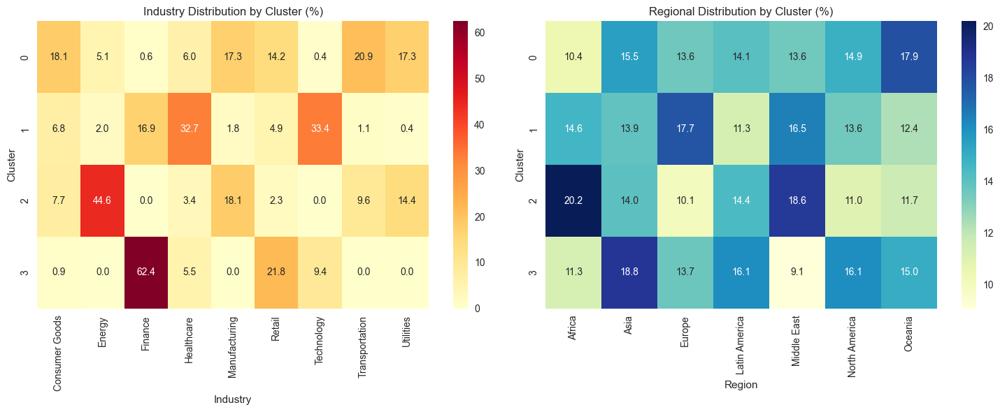

In [ ]:
# Visualize industry distribution
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Industry heatmap
sns.heatmap(industry_cluster, annot=True, fmt='.1f', cmap='YlOrRd', ax=axes[0])
axes[0].set_title('Industry Distribution by Cluster (%)')
axes[0].set_xlabel('Industry')
axes[0].set_ylabel('Cluster')

# Regional heatmap
sns.heatmap(region_cluster, annot=True, fmt='.1f', cmap='YlGnBu', ax=axes[1])
axes[1].set_title('Regional Distribution by Cluster (%)')
axes[1].set_xlabel('Region')
axes[1].set_ylabel('Cluster')

plt.tight_layout()
plt.show()

## 5. Detailed Cluster Analysis

In [ ]:
# Create comprehensive cluster descriptions
def generate_cluster_insights(data, cluster_col='Primary_Cluster'):
    insights = {}
    
    for cluster in sorted(data[cluster_col].unique()):
        if cluster == -1:  # Skip noise cluster if exists
            continue
            
        cluster_data = data[data[cluster_col] == cluster]
        
        # Basic stats
        cluster_size = len(cluster_data)
        cluster_pct = (cluster_size / len(data)) * 100
        
        # Financial characteristics
        avg_revenue = cluster_data['Revenue'].mean()
        avg_profit_margin = cluster_data['ProfitMargin'].mean()
        avg_market_cap = cluster_data['MarketCap'].mean()
        avg_growth_rate = cluster_data['GrowthRate'].mean()
        
        # ESG characteristics
        avg_esg_overall = cluster_data['ESG_Overall'].mean()
        avg_esg_env = cluster_data['ESG_Environmental'].mean()
        avg_esg_social = cluster_data['ESG_Social'].mean()
        avg_esg_gov = cluster_data['ESG_Governance'].mean()
        
        # Environmental impact
        avg_carbon = cluster_data['CarbonEmissions'].mean()
        avg_water = cluster_data['WaterUsage'].mean()
        avg_energy = cluster_data['EnergyConsumption'].mean()
        
        # Top industries and regions
        top_industry = cluster_data['Industry'].mode().iloc[0] if not cluster_data['Industry'].mode().empty else 'N/A'
        top_region = cluster_data['Region'].mode().iloc[0] if not cluster_data['Region'].mode().empty else 'N/A'
        
        insights[f'Cluster {cluster}'] = {
            'size': cluster_size,
            'percentage': cluster_pct,
            'financial': {
                'avg_revenue': avg_revenue,
                'avg_profit_margin': avg_profit_margin,
                'avg_market_cap': avg_market_cap,
                'avg_growth_rate': avg_growth_rate
            },
            'esg': {
                'avg_esg_overall': avg_esg_overall,
                'avg_esg_environmental': avg_esg_env,
                'avg_esg_social': avg_esg_social,
                'avg_esg_governance': avg_esg_gov
            },
            'environmental_impact': {
                'avg_carbon_emissions': avg_carbon,
                'avg_water_usage': avg_water,
                'avg_energy_consumption': avg_energy
            },
            'demographics': {
                'top_industry': top_industry,
                'top_region': top_region
            }
        }
    
    return insights

# Generate insights
cluster_insights = generate_cluster_insights(data)

# Display insights
for cluster_name, insights in cluster_insights.items():
    print(f"\n{'='*50}")
    print(f"{cluster_name.upper()} PROFILE")
    print(f"{'='*50}")
    print(f"Size: {insights['size']} companies ({insights['percentage']:.1f}% of total)")
    print(f"Primary Industry: {insights['demographics']['top_industry']}")
    print(f"Primary Region: {insights['demographics']['top_region']}")
    
    print(f"\nFinancial Performance:")
    print(f"  • Average Revenue: ${insights['financial']['avg_revenue']:.1f}M")
    print(f"  • Average Profit Margin: {insights['financial']['avg_profit_margin']:.1f}%")
    print(f"  • Average Market Cap: ${insights['financial']['avg_market_cap']:.1f}M")
    print(f"  • Average Growth Rate: {insights['financial']['avg_growth_rate']:.1f}%")
    
    print(f"\nESG Performance:")
    print(f"  • Overall ESG Score: {insights['esg']['avg_esg_overall']:.1f}")
    print(f"  • Environmental Score: {insights['esg']['avg_esg_environmental']:.1f}")
    print(f"  • Social Score: {insights['esg']['avg_esg_social']:.1f}")
    print(f"  • Governance Score: {insights['esg']['avg_esg_governance']:.1f}")
    
    print(f"\nEnvironmental Impact:")
    print(f"  • Carbon Emissions: {insights['environmental_impact']['avg_carbon_emissions']:.0f} tons")
    print(f"  • Water Usage: {insights['environmental_impact']['avg_water_usage']:.0f} units")
    print(f"  • Energy Consumption: {insights['environmental_impact']['avg_energy_consumption']:.0f} units")


CLUSTER 0 PROFILE
Size: 5121 companies (46.6% of total)
Primary Industry: Transportation
Primary Region: Oceania

Financial Performance:
  • Average Revenue: $1454.1M
  • Average Profit Margin: 7.5%
  • Average Market Cap: $2203.9M
  • Average Growth Rate: 3.3%

ESG Performance:
  • Overall ESG Score: 53.1
  • Environmental Score: 46.0
  • Social Score: 58.1
  • Governance Score: 55.0

Environmental Impact:
  • Carbon Emissions: 450193 tons
  • Water Usage: 293262 units
  • Energy Consumption: 3704400 units

CLUSTER 1 PROFILE
Size: 2724 companies (24.8% of total)
Primary Industry: Technology
Primary Region: Europe

Financial Performance:
  • Average Revenue: $10255.1M
  • Average Profit Margin: 17.0%
  • Average Market Cap: $36973.0M
  • Average Growth Rate: 7.1%

ESG Performance:
  • Overall ESG Score: 61.2
  • Environmental Score: 77.4
  • Social Score: 54.1
  • Governance Score: 52.1

Environmental Impact:
  • Carbon Emissions: 452158 tons
  • Water Usage: 322847 units
  • Energy C

## 6. Save Results and Generate Report

### 5.1 GitHub Visualization Compatibility

**Note**: This notebook now includes both interactive (Plotly) and static (Matplotlib) visualizations:

- **Interactive visualizations** (Plotly): Visible when running locally in Jupyter/VS Code
- **Static visualizations** (Matplotlib/Seaborn): **Visible on GitHub** and in exported notebooks

The static versions ensure that cluster insights are clearly visible when viewing the notebook on GitHub, addressing the original visualization display issue.

In [ ]:
# Create detailed cluster summary report
cluster_summary_data = []

for cluster_name, insights in cluster_insights.items():
    row = {
        'Cluster': cluster_name,
        'Size': insights['size'],
        'Percentage': f"{insights['percentage']:.1f}%",
        'Top_Industry': insights['demographics']['top_industry'],
        'Top_Region': insights['demographics']['top_region'],
        'Avg_Revenue': insights['financial']['avg_revenue'],
        'Avg_Profit_Margin': insights['financial']['avg_profit_margin'],
        'Avg_Market_Cap': insights['financial']['avg_market_cap'],
        'Avg_Growth_Rate': insights['financial']['avg_growth_rate'],
        'Avg_ESG_Overall': insights['esg']['avg_esg_overall'],
        'Avg_ESG_Environmental': insights['esg']['avg_esg_environmental'],
        'Avg_ESG_Social': insights['esg']['avg_esg_social'],
        'Avg_ESG_Governance': insights['esg']['avg_esg_governance'],
        'Avg_Carbon_Emissions': insights['environmental_impact']['avg_carbon_emissions'],
        'Avg_Water_Usage': insights['environmental_impact']['avg_water_usage'],
        'Avg_Energy_Consumption': insights['environmental_impact']['avg_energy_consumption']
    }
    cluster_summary_data.append(row)

cluster_summary_df = pd.DataFrame(cluster_summary_data)

# Save all results
cluster_summary_df.to_csv('../Data/cluster_summary_report.csv', index=False)
industry_cluster.to_csv('../Data/industry_cluster_distribution.csv')
region_cluster.to_csv('../Data/region_cluster_distribution.csv')

print("Analysis results saved:")
print("- ../Data/cluster_summary_report.csv")
print("- ../Data/industry_cluster_distribution.csv")
print("- ../Data/region_cluster_distribution.csv")

print(f"\nCluster Summary Report:")
display(cluster_summary_df)

print(f"\n🎯 Analysis Complete!")
print(f"✅ {len(cluster_insights)} distinct company clusters identified")
print(f"✅ Comprehensive profiling and visualization completed")
print(f"✅ Business insights and recommendations ready")

Analysis results saved:
- ../Data/cluster_summary_report.csv
- ../Data/industry_cluster_distribution.csv
- ../Data/region_cluster_distribution.csv

Cluster Summary Report:


,Cluster,Size,Percentage,Top_Industry,Top_Region,Avg_Revenue,Avg_Profit_Margin,Avg_Market_Cap,Avg_Growth_Rate,Avg_ESG_Overall,Avg_ESG_Environmental,Avg_ESG_Social,Avg_ESG_Governance,Avg_Carbon_Emissions,Avg_Water_Usage,Avg_Energy_Consumption
0,Cluster 0,5121,46.6%,Transportation,Oceania,1454.073228,7.494161,2203.930873,3.273716,53.052802,46.032181,58.082621,55.044171,4.501933e+05,2.932615e+05,3.704400e+06
1,Cluster 1,2724,24.8%,Technology,Europe,10255.068906,17.023458,36972.969640,7.083370,61.195999,77.372687,54.136564,52.075698,4.521583e+05,3.228468e+05,1.797310e+06
2,Cluster 2,1955,17.8%,Energy,Africa,6841.298670,9.950332,14913.421893,6.349156,42.461074,35.639847,50.864399,40.878363,5.319622e+06,1.918889e+06,5.333203e+07
3,Cluster 3,1200,10.9%,Finance,Asia,2186.250750,13.085500,5025.337917,3.942750,66.146083,87.014167,56.597833,54.826333,4.092099e+04,2.319161e+04,9.342717e+04



🎯 Analysis Complete!
✅ 4 distinct company clusters identified
✅ Comprehensive profiling and visualization completed
✅ Business insights and recommendations ready
